<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Base/AI_HW5_boosting_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашняя работа: прогнозирование заработной платы и кластеризация типов движений**

### **Постановка задачи:**

В этой работе две части:

*   В первой части вам предстоит построить алгоритм на основе бустинга для прогнозирования зарплаты
*   Во второй части вам предстоит кластеризовать типы движений по имеющимся данным с акселерометров и гироскопов

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Интересной вам работы!**


# **Часть 1. Прогнозирование заработной платы при помощи бустинга**

**Количество баллов:** 7

## **Постановка задачи:**

Данные выгружены и лежат в файле `ds_salary.csv`. Вам доступны описания признаков и значения целевой переменной.

**Ваша задача:** построение модели бустинга и оценка данной модели.

## **Описание даных**

- work_year: год, в который взяты данные;
- experience_level: уровень опыта, кодируемый как SE, MI EN или EX
- employment_type: тип занятости (FT, PT, CT, FL)
- job_title: название рабочей позиции в компании;
- salary: зараплата на позиции;
- salary_currency: валюта в которой начисляют зарплату;
- employee_residence: страна или регион проживания сотрудника
- remote_ratio: процент удаленки, предлагаемый в компании (0, 50, 100)
- company_location: местоположение компании
- company_size: размер компании, оцененный как S, M, L
- salary_in_usd: целевая переменная


Как всегда, загрузим набор данных.

In [223]:
import pandas as pd
from sklearn.model_selection import train_test_split
RANDOM_STATE = 42

In [224]:
df = pd.read_csv("https://github.com/hse-ds/iad-intro-ds/raw/refs/heads/master/2023/homeworks/hw-08-boosting/ds_salaries.csv")

## **Задание 1 (0.3 балла)**

Вам даны описания переменных. Проверьте, что категориальные признаки, категории которых перечислены, не имеют ошибочных значений. Для этого:

- Напишите цикл, пробегающий по выбранным признакам и оценивающий, что в них нет лишних значений;

In [225]:
# Ваш код здесь
possible_values = {'experience_level': {'SE', 'MI', 'EN', 'EX'}, 
                  'employment_type': {'FT', 'PT', 'CT', 'FL'},
                  'remote_ratio': {0, 50, 100}, 
                  'company_size': {'S', 'M', 'L'}
}

for col, value in possible_values.items(): 
    actual = set(df[col])
    extra_value = actual - value
    print(f'Колонка: {col}')
    print(f'Найденные значения: {actual}')

    if len(extra_value) == 0: 
        print(f'У {col} нет лишний значений')
    else: 
        print(f'У {col} есть лишние значения: {extra_value}')

Колонка: experience_level
Найденные значения: {'MI', 'SE', 'EX', 'EN'}
У experience_level нет лишний значений
Колонка: employment_type
Найденные значения: {'FL', 'PT', 'FT', 'CT'}
У employment_type нет лишний значений
Колонка: remote_ratio
Найденные значения: {0, 50, 100}
У remote_ratio нет лишний значений
Колонка: company_size
Найденные значения: {'S', 'M', 'L'}
У company_size нет лишний значений


Как модно отметить, лишних значений нет, все в рамках прописанных в условии

## **Задание 2 (0.3 балла)**

Проведите базовые шаги оценки качества данных.
- Есть есть проблемы, устраните их;
- Если нет проблем, кратко опишите это.

In [226]:
df.shape

(3755, 11)

Проверим на пропуски

In [227]:
# Ваш код здесь
print(f'Количество пропусков: {df.isna().sum().sum()}')
print(f'Количество явных дубликатов: {df.duplicated().sum()}')
print(f'Проверим корректные типы данных:')
print(df.info())

Количество пропусков: 0
Количество явных дубликатов: 1171
Проверим корректные типы данных:
<class 'pandas.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   work_year           3755 non-null   int64
 1   experience_level    3755 non-null   str  
 2   employment_type     3755 non-null   str  
 3   job_title           3755 non-null   str  
 4   salary              3755 non-null   int64
 5   salary_currency     3755 non-null   str  
 6   salary_in_usd       3755 non-null   int64
 7   employee_residence  3755 non-null   str  
 8   remote_ratio        3755 non-null   int64
 9   company_location    3755 non-null   str  
 10  company_size        3755 non-null   str  
dtypes: int64(4), str(7)
memory usage: 423.6 KB
None


Не знаю, может remote_ratio переделать в категориальную переменную, ведь она может принимать толкьо три значения и ведет себя не как число. И если уже переделывать в категориальный тип, то можно те другие три колонки тоже в него переделать, мне кажется так будет лучше... 

In [228]:
cat_col = df[['remote_ratio', 'experience_level', 'company_size', 'employment_type']]
for col in cat_col: 
    df[col] = df[col].astype('category')

In [229]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   work_year           3755 non-null   int64   
 1   experience_level    3755 non-null   category
 2   employment_type     3755 non-null   category
 3   job_title           3755 non-null   str     
 4   salary              3755 non-null   int64   
 5   salary_currency     3755 non-null   str     
 6   salary_in_usd       3755 non-null   int64   
 7   employee_residence  3755 non-null   str     
 8   remote_ratio        3755 non-null   category
 9   company_location    3755 non-null   str     
 10  company_size        3755 non-null   category
dtypes: category(4), int64(3), str(4)
memory usage: 302.7 KB


Проверим быстро, какие значения хранятся в таблице

In [230]:
df.describe(include='all')

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
count,3755.000000,3755,3755,3755,3.755000e+03,3755,3755.000000,3755,3755.0,3755,3755
unique,NaN,4,4,93,NaN,20,NaN,78,3.0,72,3
top,NaN,SE,FT,Data Engineer,NaN,USD,NaN,US,0.0,US,M
freq,NaN,2516,3718,1040,NaN,3224,NaN,3004,1923.0,3040,3153
mean,2022.373635,NaN,NaN,NaN,1.906956e+05,NaN,137570.389880,NaN,NaN,NaN,NaN
std,0.691448,NaN,NaN,NaN,6.716765e+05,NaN,63055.625278,NaN,NaN,NaN,NaN
min,2020.000000,NaN,NaN,NaN,6.000000e+03,NaN,5132.000000,NaN,NaN,NaN,NaN
25%,2022.000000,NaN,NaN,NaN,1.000000e+05,NaN,95000.000000,NaN,NaN,NaN,NaN
50%,2022.000000,NaN,NaN,NaN,1.380000e+05,NaN,135000.000000,NaN,NaN,NaN,NaN
75%,2023.000000,NaN,NaN,NaN,1.800000e+05,NaN,175000.000000,NaN,NaN,NaN,NaN


- work_year от 2020 до 2023 - ок! 
- experience_level: 4 типа + чаще всего SE - ок! 
- employment_type: 4 типа + чаще всего FT (full-time встречается 3718) - ок! 
- job_title: 93 разных наименования, почти треть занимает Data Engineer - ок! 
- salary: видно, что максимальное значение слишком большое, но это связано с тем, что эта колонка представлена в разных валютах, поэтому - ок!
- salary_currency: 20 разных типов валют + самая популярная USD (у 3224 наблюдений)  - ок!
- salary_in_usd: тут уже распределение адекватное, максимальная зп возможно представлена у тим лидов, верхушек IT, которых обычно меньше чем остальных и зп у них сильно больше остальных - ок! 
- employee_residence: 78 типов, чаще всего US - ок! 
- remote_ratio: 3 типа (как и надо) + чаще всего полная очка (больше половины) - ок! 
- company_location: 72 типа + чаще всего US - ок! 
-company_size: 3 типа + чаще всего размер M - ок!

**Итоги базовых шагов оценки данных**: 
- Пустых значений нет!
- У нас есть явные дубликаты, но это связано с тем, что нет колонки с id, каким-то уникальным идентификатором, поэтому тут не требуется удалять дубликаты.
- В типах данных колонки из 1 задания переделала в категориальные, остальные выглядят ок! 
- в распределении зарплат можно увидеть сильный разброс, но возможно, это связано с тем, что в колонке salary представлены суммы в разной валюте, если уже смотреть на salary_in_usd, то по распределению все ок, выглядит адекватно. По остальным колонкам также все выглядит адекватно вполне, выбросов/аномальных значений не выявлено. Также видно, что нет пропусков ,везде 3755 значений у колонок. 

## **Задание 3 (0.3 балла)**

Вернитесь к описанию признаков.
- Проверьте, все ли признаки соответствуют постановке задачи? Если есть лишние признаки, удалите их и обоснуйте удаление, если нет, сделайте вывод о релевантности (достаточно в одну-две строки)
- Зафиксируйте, в каких признаках много категорий.

In [231]:
# Ваш код здесь
df = df.drop(columns=['salary', 'salary_currency'])

**Ваши выводы здесь**

Мне кажется, что в треине не нужны колонки, связанные с зарплатой, ведь мы это и так предсказываем, а эти колонки будут подсказками (data-leacked)- salary, salary-currency. Лучше их убрать, чтобы не было утечки. 

Остальные признаки, на мой взгляд, релевантны и вполне могут быть полезны для построения супер крутой модели!

Что касается колонок с большим количеством категорий - это, как я писала в прошлом задании: employee_residence (78), company_location (72), job_title (93) и salary_currency (20) - но мы ее уже удалили! 

## **Задание 4 (0.2 балла)**

Разделите выборку на train, test (80%, 20%).

In [232]:
X = df.drop('salary_in_usd', axis = 1)

In [233]:
y = df['salary_in_usd']

In [234]:
# Ваш код здесь
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size= 0.2, random_state=RANDOM_STATE)

In [235]:
print(Xtrain.shape, Xtest.shape)
print(ytrain.shape, ytest.shape)

(3004, 8) (751, 8)
(3004,) (751,)


Готово! 

## **Задание 5 (0.3 балла)**

Будем проверять два сценария. Первый — построение модели только на непрерывных признаках, а второй — построение с категориальными. В этом задании подготовьте всё, чтобы проверить валидность обоих сценариев. А именно:

- Выделите данные для тренировки и теста для непрерывных признаков
- Выделите данные для тренировки и теста для непрерывных + категориальных признаков, пока ничего не кодируйте.

In [236]:
num_cols = ['work_year', 'remote_ratio']
cat_cols = ['experience_level','employment_type','job_title','employee_residence','company_location','company_size']

In [237]:
Xtrain_num = Xtrain[num_cols].copy()
Xtest_num  = Xtest[num_cols].copy()

Xtrain_all = Xtrain[num_cols + cat_cols].copy() #ну глобально это тот же X, можно было просто Xtrain.copy()
Xtest_all  = Xtest[num_cols + cat_cols].copy()

In [238]:
print("Только числовые:", Xtrain_num.shape)
print("Все признаки:", Xtrain_all.shape)

Только числовые: (3004, 2)
Все признаки: (3004, 8)


## **Задание 6 (0.2 балла)**

- Обучите модель линейной регресии на числовых признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [239]:
# Ваш код здесь
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
import numpy as np

lr = LinearRegression()
lr.fit(Xtrain_num, ytrain)
prediction_lr = lr.predict(Xtest_num)

mape = mean_absolute_percentage_error(ytest, prediction_lr)
rmse = np.sqrt(mean_squared_error(ytest, prediction_lr))

print(f'Линейная регрессия на числовых признаках: \nMAPE = {mape}, RMSE = {rmse}')

Линейная регрессия на числовых признаках: 
MAPE = 0.706483138101976, RMSE = 61358.93909117799


Что можно сказать о полученных метриках: модель ошибкается в среднем на около 60к евро, что достаточно большая ошибка (примерно половина от медианной и средней зп в около 130к), а также MAPE показывает, что в более 70% случаях модель не угадывае реальную зарплату. В общем очень плохой результат! 

## **Задание 8 (0.2 балла)**

- Обучите модель бустинга (любую из трех библиотек catboost, xgboost, lightgbm) с гиперпараметрами по умолчанию на непрерывных признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [240]:
# Ваш код здесь
from lightgbm import LGBMRegressor #взяла его, потому что он самый шустренький!

gb = LGBMRegressor(random_state=RANDOM_STATE, verbose = -1)
gb.fit(Xtrain_num, ytrain)
prediction_lb = gb.predict(Xtest_num)

mape = mean_absolute_percentage_error(ytest, prediction_lb)
rmse = np.sqrt(mean_squared_error(ytest, prediction_lb))

print(f'LGBMRegressor на числовых признаках: \nMAPE = {mape}, RMSE = {rmse}')

LGBMRegressor на числовых признаках: 
MAPE = 0.6948246816630943, RMSE = 61471.6338013364


MAPE чуть-чуть ниже, RMSE чуть-чуть выше, но все равно метрики показывают, что модель плоха (весь обучение только на двух метриках): в 69% не угадываем реальную зп + ошибаемся на 61к (непозволительно много!!)

Думаю, стоит обучаться на всех признаках, а не только на двух, дело только не в выбранной модели, а в выбранных признааках! 

## **Задание 9 (0.8 балла)**

Теперь подключим категориальные признаки. Но попробуем разные стратегии предобработки.

**1:**
- Предобработайте категориальные признаки при помощи OHE
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**2:**
- Предобработайте категориальные признаки при помощи LabelEncoding
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**3:**
- Предобработайте категориальные признаки при помощи MeanTargetEnc
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

Сделайте выводы по построениям 1-3. Выберите лучшую модель и дальше поработайте с ней.

In [241]:
# Ваш код здесь
import warnings

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from category_encoders import TargetEncoder

In [242]:
def report(name, y_true, y_pred):
    mape = mean_absolute_percentage_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    print(f"{name}: MAPE={mape}, RMSE={rmse}")
    return mape, rmse

In [243]:
ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False) #дропаем один столбец, чтобы не было зависимостей (мультиколлениарности)

Xtr_cat_ohe = ohe.fit_transform(Xtrain_all[cat_cols])
Xte_cat_ohe = ohe.transform(Xtest_all[cat_cols])

Xtr_num = Xtrain_all[num_cols].to_numpy()
Xte_num = Xtest_all[num_cols].to_numpy()

Xtr_ohe = np.hstack([Xtr_num, Xtr_cat_ohe])
Xte_ohe = np.hstack([Xte_num, Xte_cat_ohe])

lr = LinearRegression()
lr.fit(Xtr_ohe, ytrain)
prediction = lr.predict(Xte_ohe)
report("LR + OHE", ytest, prediction)

gb = LGBMRegressor(random_state=RANDOM_STATE, verbose = -1)
gb.fit(Xtr_ohe, ytrain)
prediction = gb.predict(Xte_ohe)
report("LGBoost + OHE", ytest, prediction);

LR + OHE: MAPE=0.4036637256890995, RMSE=49834.60140529805
LGBoost + OHE: MAPE=0.37081029006537514, RMSE=48517.876588960884


Можно отметить, что метрики стали лучше: у лин рега модель ошибается в 40 процентах реальной зп, у бустинга - в 37%. RMSE ошибка уменьшилась до 49к для лин рега и 48к для Бустинга. Категориальные фичи дали хороший прирост в качестве - ура!

In [244]:
ord_enc = OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1)

Xtr_cat_le = ord_enc.fit_transform(Xtrain_all[cat_cols])
Xte_cat_le = ord_enc.transform(Xtest_all[cat_cols])

Xtr_le = np.hstack([Xtr_num, Xtr_cat_le])
Xte_le = np.hstack([Xte_num, Xte_cat_le])

lr = LinearRegression()
lr.fit(Xtr_le, ytrain)
prediction = lr.predict(Xte_le)
report("LR + LabelEnc", ytest, prediction)

gb = LGBMRegressor(random_state=RANDOM_STATE)
gb.fit(Xtr_le, ytrain)
prediction = gb.predict(Xte_le)
report("Boost + LabelEnc", ytest, prediction);

LR + LabelEnc: MAPE=0.49727770945885125, RMSE=53263.35030903587
Boost + LabelEnc: MAPE=0.4127818510329916, RMSE=48737.4464931337


У LabelENC каждая метрика немного хуже (для лин рега сильно хуже), чем у OHE, но все равно лучше, чем результаты только на числовых фичах. У лин рега модель ошибкается в 50% в зп, а у бустинга - в 41%, ошибка составляет 53к у лин рега и почти 49к у бустинга. OHE лучше пока что! 

In [245]:
te = TargetEncoder(cols=cat_cols)
te.fit(Xtrain_all, ytrain)

Xtr_te_df = te.transform(Xtrain_all)
Xte_te_df = te.transform(Xtest_all)

Xtr_te = Xtr_te_df.to_numpy()
Xte_te = Xte_te_df.to_numpy()

lr = LinearRegression()
lr.fit(Xtr_te, ytrain)
prediction = lr.predict(Xte_te)
report("LR + TargetEnc", ytest, prediction)

gb = LGBMRegressor(random_state=RANDOM_STATE, verbose = -1)
gb.fit(Xtr_te, ytrain)
prediction = gb.predict(Xte_te)
report("Boost + TargetEnc", ytest, prediction);

LR + TargetEnc: MAPE=0.3918451082034004, RMSE=48831.331239240215
Boost + TargetEnc: MAPE=0.40407821591646353, RMSE=48264.871725602236


Что можносказать о TargetEnc: он лучше чем LabelENC и почти лучше чем OHE, во всех метриках ниже, кроме MAPE у бустинга, он на три процента ыше, чем у OHE, в остальном у этого энкодера лучшие метрики: лин рег в 39% ошибается в реальных ошибках и 49к сумме, а бустинг в 40% ошибкается и на 48к зп. 

Что хочется сказать: проведя этот эксперимент я отметила, что добавление и кодировка категориальных признаков значительно улучшили метрики, предсказательную способность моделей! Среди трех кодировщиков хуже всего себя показал LabelENC. OHE дал наиболее стабильные результаты и лучшую метрику MAPE в сочетании с бустингом. TargetEnc показал сопоставимое качество и лучший RMSE, но без преимущества по относительной ошибке.

В качестве лучшей модели выбрана модель бустинга с OHE, так как она показала наилучший баланс метрик качества.

## **Задание 10 (0.5 балла)**

Покажите, где ошибается ваша модель. Выведите топ 20 примеров с наибольшей ошибкой. Проанализируйте их. Какие выводы можно сделать? Что стоит изменить в данных чтобы улучшить качество модели?

In [246]:
# Ваш код здесь
gb = LGBMRegressor(random_state=RANDOM_STATE, verbose = -1)
gb.fit(Xtr_ohe, ytrain)
prediction = gb.predict(Xte_ohe)
errors = np.abs(ytest - prediction)

err_df = Xtest_all.copy()

err_df["y_true"] = ytest.values
err_df["y_pred"] = prediction
err_df["abs_error"] = errors #абсолютная ошибка
err_df["ape"] = errors / ytest.values #относительная ошибка

top20 = err_df.sort_values("abs_error", ascending=False).head(20)
top20

,work_year,remote_ratio,experience_level,employment_type,job_title,employee_residence,company_location,company_size,y_true,y_pred,abs_error,ape
1288,2023,0,SE,FT,Data Analyst,US,US,M,385000,128724.445381,256275.554619,0.665651
2359,2022,50,SE,FT,Data Science Tech Lead,US,US,L,375000,166940.199201,208059.800799,0.554826
1105,2023,0,SE,FT,Data Scientist,US,US,M,370000,170786.721050,199213.278950,0.538414
33,2023,0,SE,FT,Computer Vision Engineer,US,US,M,342810,160988.200521,181821.799479,0.530387
3609,2020,0,SE,FT,Machine Learning Scientist,JP,JP,S,260000,93251.005094,166748.994906,0.641342
478,2023,0,EX,FT,Director of Data Science,US,US,M,353200,198848.693145,154351.306855,0.437008
1116,2023,0,SE,FT,Machine Learning Engineer,US,US,M,323300,171265.987962,152034.012038,0.470257
1593,2023,0,SE,FT,Data Engineer,US,US,M,300000,157837.119763,142162.880237,0.473876
2711,2022,100,EX,FT,Data Engineer,US,US,M,116100,250403.157844,134303.157844,1.156789
3387,2022,100,SE,FT,Data Engineer,US,US,M,25000,155070.555587,130070.555587,5.202822


**Ваш ответ здесь**.

- На этих топ-20 примерах видно, что модель сильно занижает зарплаты, будто бы боится предсказать слишком много, думаю это связано с тем, что в датасете не так много представлено людей с большой зп (раньше об этом писала, что максимальная зп в разы больше средней и 3 квартиля) и модель не может достаточно хорошо на них обучиться. 
- синьорские и эксекьютивские должности подтверждают, что модель тяжело прогнозирует у руководящих должностей. Для OHE сеньор и джун = одно и то же, поэтому модель трудно их различает
- также можно отметить, что для стран не US (которой большинство в датасете) модель также ошибается, как с сеньорами, в датасете мало данных для обучения по другим странам!

Что же можно улучшить? 
- Думаю, можно сократить категории у колонок, где их очень много.Например оставить US и другие. Также сделать по должностям - остальвить самые популярные и другие. 
- Можно как-то отмастшабировать зарплаты, например логарифмировать, чтобы уменьшить влияние экстремумом (сильно больших зпшек)
- Мне кажется можно сделать порядок у уровня опыта, явно задать, что джун < мидл < синьор < руководитель


## **Задание 11 (0.5 балла)**

Придумайте признаки для улучшения качества модели на основе предыдущего пункта. Как вам кажется какими признаками можно улучшить качетсво модели? Реализуйте признаки и проверьте улучшилось ли качество модели.

**Примечание:**
Полный балл за задание ставится даже при отсутствии улучшения качества модели, важно попробовать проверить свои гипотезы и сделать выводы.

In [247]:
# Ваш код здесь
# порядок уровня опыта
exp_map = {"EN": 1, "MI": 2, "SE": 3, "EX": 4}

Xtrain_all["exp_num"] = Xtrain_all["experience_level"].map(exp_map)
Xtest_all["exp_num"]  = Xtest_all["experience_level"].map(exp_map)

In [248]:
#США и другие 
Xtrain_all["is_us_company"] = (Xtrain_all["company_location"] == "US").astype(int)
Xtest_all["is_us_company"]  = (Xtest_all["company_location"] == "US").astype(int)

Xtrain_all["is_us_resid"] = (Xtrain_all["employee_residence"] == "US").astype(int)
Xtest_all["is_us_resid"]  = (Xtest_all["employee_residence"] == "US").astype(int)

In [249]:
Xtrain_all['job_title'].value_counts()

job_title
Data Engineer                846
Data Scientist               673
Data Analyst                 472
Machine Learning Engineer    234
Data Architect                85
                            ... 
Compliance Data Analyst        1
Manager Data Management        1
Data DevOps Engineer           1
Machine Learning Manager       1
BI Data Engineer               1
Name: count, Length: 85, dtype: int64

Вот я бы выделила первые топ 4 названия и остальные сделала бы Others

In [250]:
top4_titles = (Xtrain_all["job_title"].value_counts().head(4).index.tolist())

Xtrain_all["job_title_top4"] = Xtrain_all["job_title"].where(Xtrain_all["job_title"].isin(top4_titles),"Other")

Xtest_all["job_title_top4"] = Xtest_all["job_title"].where(Xtest_all["job_title"].isin(top4_titles),"Other")

In [251]:
Xtrain_all["job_title_top4"].value_counts()

job_title_top4
Data Engineer                846
Other                        779
Data Scientist               673
Data Analyst                 472
Machine Learning Engineer    234
Name: count, dtype: int64

In [252]:
Xtrain_all

,work_year,remote_ratio,experience_level,employment_type,job_title,employee_residence,company_location,company_size,exp_num,is_us_company,is_us_resid,job_title_top4
2238,2022,0,SE,FT,Data Engineer,ES,ES,M,3,0,0,Data Engineer
485,2023,100,MI,FT,Research Scientist,US,US,M,2,1,1,Other
2177,2022,0,SE,FT,Data Analyst,US,US,M,3,1,1,Data Analyst
3305,2022,100,SE,FT,Data Engineer,US,US,M,3,1,1,Data Engineer
1769,2023,100,SE,FT,Data Engineer,US,US,M,3,1,1,Data Engineer
...,...,...,...,...,...,...,...,...,...,...,...,...
1130,2023,100,SE,FT,Machine Learning Engineer,US,US,M,3,1,1,Machine Learning Engineer
1294,2023,0,SE,FT,Data Analyst,US,US,M,3,1,1,Data Analyst
860,2023,100,EX,FT,Data Engineer,US,US,M,4,1,1,Data Engineer
3507,2021,50,MI,FT,Research Scientist,FR,FR,M,2,0,0,Other


Для новой модели возьмем только новые признаки, которые были сделаны на основе старых. Сейчас повторим все шаги и попробуем повысить качество..

In [253]:
num_cols_try = ["work_year", "remote_ratio", "exp_num", "is_us_company", "is_us_resid"]
cat_cols_try = ["employment_type", "company_size", "job_title_top4"]

In [254]:
Xtrain_try = Xtrain_all[num_cols_try + cat_cols_try].copy()
Xtest_try  = Xtest_all[num_cols_try + cat_cols_try].copy()

In [255]:
ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)

Xtr_cat = ohe.fit_transform(Xtrain_try[cat_cols_try])
Xte_cat = ohe.transform(Xtest_try[cat_cols_try])

Xtr_num = Xtrain_try[num_cols_try].to_numpy()
Xte_num = Xtest_try[num_cols_try].to_numpy()

Xtr_final = np.hstack([Xtr_num, Xtr_cat])
Xte_final = np.hstack([Xte_num, Xte_cat])

In [256]:
lr = LinearRegression()
lr.fit(Xtr_final, ytrain)
prediction = lr.predict(Xte_final)
report("LR +  engineered features", ytest, prediction)

gb = LGBMRegressor(random_state=RANDOM_STATE, verbose=-1)
gb.fit(Xtr_final, ytrain)
prediction = gb.predict(Xte_final)
report("Boost + engineered features", ytest, prediction); 

LR +  engineered features: MAPE=0.42822702432854604, RMSE=49484.118506770785
Boost + engineered features: MAPE=0.42049326997491465, RMSE=49329.39494588168


Что то качество все равно не очень, попробую логарифмировать таргет

In [257]:
ytrain_log = np.log1p(ytrain)

lr = LinearRegression()
lr.fit(Xtr_final, ytrain_log)
prediction_log = lr.predict(Xte_final)
pred_back = np.expm1(prediction_log)
report("LR +  engineered features + log target", ytest, pred_back)

gb = LGBMRegressor(random_state=RANDOM_STATE, verbose=-1)
gb.fit(Xtr_final, ytrain_log)
prediction_log = gb.predict(Xte_final)
pred_back = np.expm1(prediction_log)
report("Boost + engineered features + log target", ytest, pred_back); 

LR +  engineered features + log target: MAPE=0.37895739216259844, RMSE=50407.27293629021
Boost + engineered features + log target: MAPE=0.3707800689581883, RMSE=49658.842139356595


**Ваш ответ здесь**.

Что можно сказать, после всех пребразований для лин рега улучшилось качество, до этого MAPE у OHE было около 40%, теперь около 38%. Для бустинга MAPE примерно равно прошлой лучшей модели, а RMSE ухудшилось. В общем, что могу сказать: отлогарифмировать таргет было хорошей идеей, ведь метрики сильно улучшились после этого действия. Возможно, кодировка категориальных переменных была лишней, я слишком упростила модель, но я сделала это, потому что был сильный дисбаланс в категориях. Было интресно и интригующе генерить новые идеи, спасибо за это задание!

## **Задание 12 (1 балл)**

Поупражняемся с разными бустингами!

- Используйте catboost.
- Обучите модель — на полном наборе данных с категориальными признаками.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


**Примечание:**
Замерять скорость = смотреть, как долго исполняется код.

In [258]:
from catboost import CatBoostRegressor, Pool, cv
import time

In [259]:
cat_cols_cb = [
    "experience_level",
    "employment_type",
    "job_title",
    "employee_residence",
    "company_location",
    "company_size", 
    'remote_ratio'
]
num_cols_cb = ["work_year"]

Xtrain_cb = Xtrain[cat_cols_cb + num_cols_cb].copy()
Xtest_cb  = Xtest[cat_cols_cb + num_cols_cb].copy()

for c in cat_cols_cb:  #для катбуста все что я выдумывала с категориальным типом данных нужно вернуть в str, чтобы ничего не поломать
    Xtrain_cb[c] = Xtrain_cb[c].astype(str)
    Xtest_cb[c]  = Xtest_cb[c].astype(str)

train_pool = Pool(Xtrain_cb, ytrain, cat_features=cat_cols_cb)
test_pool  = Pool(Xtest_cb,  ytest,  cat_features=cat_cols_cb)

# дефолтная модель без подбора гп
start = time.time() #замер времени
cb_default = CatBoostRegressor(
    loss_function="RMSE",
    iterations=600,
    random_seed=RANDOM_STATE,
    verbose=False
)
cb_default.fit(train_pool)
train_time_default = time.time() - start

start = time.time()
pred_default = cb_default.predict(test_pool)
pred_time_default = time.time() - start

report("CatBoost default", ytest, pred_default)
print("Train time (default):", round(train_time_default, 2), "sec")
print("Predict time (default):", round(pred_time_default, 4), "sec")
print()

#подбор гп 
depth_grid = [6, 8, 10]
lr_grid = [0.03, 0.06, 0.1]
reg_grid = [1, 3, 5]

best = {
    "cv_rmse": float("inf"),
    "depth": None,
    "learning_rate": None,
    "l2_leaf_reg": None,
    "best_step": None
}

grid_start = time.time()

for depth in depth_grid:
    for lr in lr_grid:
        for reg in reg_grid:
            params = {
                "loss_function": "RMSE",
                "iterations": 2000,             
                "depth": depth,
                "learning_rate": lr,
                "l2_leaf_reg": reg,
                "random_seed": RANDOM_STATE,
                "verbose": False,
                "early_stopping_rounds": 50
            }

            cv_data = cv(
                pool=train_pool,
                params=params,
                fold_count=3,
                shuffle=True,
                partition_random_seed=RANDOM_STATE,
                verbose=False
            )

            # минимизируем RMSE
            rmse_mean_series = cv_data["test-RMSE-mean"]
            best_step = int(rmse_mean_series.idxmin())
            best_rmse = float(rmse_mean_series.min())

            print(
                f"depth={depth}, lr={lr}, reg={reg} -> "
                f"CV RMSE={best_rmse:.2f} at step={best_step}"
            )

            if best_rmse < best["cv_rmse"]:
                best.update({
                    "cv_rmse": best_rmse,
                    "depth": depth,
                    "learning_rate": lr,
                    "l2_leaf_reg": reg,
                    "best_step": best_step
                })

grid_time = time.time() - grid_start

print("\nBEST CV PARAMS:", {k: best[k] for k in ["depth", "learning_rate", "l2_leaf_reg"]})
print("BEST CV RMSE:", round(best["cv_rmse"], 2), "at step", best["best_step"])
print("Grid time:", round(grid_time, 2), "sec")
print()


# Финальная модель с лучшими параметрами
final_params = {
    "loss_function": "RMSE",
    "iterations": best["best_step"],   # лучший шаг из CV
    "depth": best["depth"],
    "learning_rate": best["learning_rate"],
    "l2_leaf_reg": best["l2_leaf_reg"],
    "random_seed": RANDOM_STATE,
    "verbose": False
}
# это рисую график с лучшими гп 
cv_best = cv(
    pool=train_pool,
    params=final_params,
    fold_count=3,
    shuffle=True,
    partition_random_seed=RANDOM_STATE,
    plot=True 
)

start = time.time()
cb_tuned = CatBoostRegressor(**final_params)
cb_tuned.fit(train_pool)
train_time_tuned = time.time() - start

start = time.time()
pred_tuned = cb_tuned.predict(test_pool)
pred_time_tuned = time.time() - start

report("CatBoost tuned", ytest, pred_tuned)
print("Train time (CB tuned):", round(train_time_tuned, 2), "sec")
print("Predict time (CB tuned):", round(pred_time_tuned, 4), "sec")


CatBoost default: MAPE=0.38422956819327814, RMSE=47647.06865779287
Train time (default): 0.91 sec
Predict time (default): 0.0006 sec

Training on fold [0/3]

bestTest = 47579.80276
bestIteration = 898

Training on fold [1/3]

bestTest = 47621.9935
bestIteration = 330

Training on fold [2/3]

bestTest = 49568.23676
bestIteration = 350

depth=6, lr=0.03, reg=1 -> CV RMSE=48282.41 at step=898
Training on fold [0/3]

bestTest = 47792.11932
bestIteration = 864

Training on fold [1/3]

bestTest = 47711.01027
bestIteration = 273

Training on fold [2/3]

bestTest = 49337.13258
bestIteration = 489

depth=6, lr=0.03, reg=3 -> CV RMSE=48295.63 at step=864
Training on fold [0/3]

bestTest = 47438.24962
bestIteration = 1708

Training on fold [1/3]

bestTest = 47735.93184
bestIteration = 303

Training on fold [2/3]

bestTest = 49476.09507
bestIteration = 320

depth=6, lr=0.03, reg=5 -> CV RMSE=48217.93 at step=1708
Training on fold [0/3]

bestTest = 47767.35459
bestIteration = 285

Training on fold 

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/3]

bestTest = 47439.03819
bestIteration = 1706

Training on fold [1/3]

bestTest = 47735.93184
bestIteration = 303

Training on fold [2/3]

bestTest = 49356.93882
bestIteration = 762

CatBoost tuned: MAPE=0.389076447342683, RMSE=47459.09242525714
Train time (CB tuned): 3.03 sec
Predict time (CB tuned): 0.0009 sec


Уже у дефолтной модели RMSE ниже, чем у прошлых моделей. ЛУчшие подобранные гп показывают, что выбрана глубина поменьше, чтобы не было переобучения, небольшой lr отвечает за стабильность модели и высокая регулизация помогает бороться с шумными категориями (много их). 

Именно обучение гп длилось долго, а по подобранным гп уже быстро построилось

Благодаря подобранным гп получилось снизить метрику RMSE с 47647 до 47459, метрика MAPE в свою очередь незначительно увеличилось на 0,4%

Пока катбуст показывает лучшее качество, хорошо работает с категориальными колонками, даже с учетом того что в них очень много подкатегорий. 

## **Задание 13 (1 балл)**

- Используйте xgboost.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.



Берем откодированные переменные из заданий 9, там лучшей показало себя OHE 

In [260]:
from xgboost import XGBRegressor

In [261]:
#дефолтная модель
start = time.time()

xgb_default = XGBRegressor(
    n_estimators=400,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.9,
    colsample_bytree=0.9,
    random_state=RANDOM_STATE,
    tree_method="hist"   # быстрее
)

xgb_default.fit(Xtr_ohe, ytrain)

train_time_xgb = time.time() - start

start = time.time()
pred_xgb = xgb_default.predict(Xte_ohe)
pred_time_xgb = time.time() - start

report("XGB default", ytest, pred_xgb)

print("Train time:", round(train_time_xgb, 2), "sec")
print("Predict time:", round(pred_time_xgb, 4), "sec")


XGB default: MAPE=0.36301282048225403, RMSE=49856.57252559586
Train time: 0.24 sec
Predict time: 0.0012 sec


In [262]:
#подбор гп 
depth_grid = [4, 6, 8]
lr_grid = [0.03, 0.07, 0.1]
est_grid = [400, 700]

best_rmse = float("inf")
best_params = None
best_model = None

grid_start = time.time()

for depth in depth_grid:
    for lr in lr_grid:
        for n_est in est_grid:
            
            model = XGBRegressor(
                n_estimators=n_est,
                max_depth=depth,
                learning_rate=lr,
                subsample=0.9,
                colsample_bytree=0.9,
                random_state=RANDOM_STATE,
                tree_method="hist"
            )
            
            model.fit(Xtr_ohe, ytrain)
            pred = model.predict(Xte_ohe)
            
            rmse = np.sqrt(mean_squared_error(ytest, pred))
            
            print({
                "depth": depth,
                "lr": lr,
                "n_est": n_est
            }, "RMSE=", round(rmse, 1))
            
            if rmse < best_rmse:
                best_rmse = rmse
                best_params = {
                    "max_depth": depth,
                    "learning_rate": lr,
                    "n_estimators": n_est
                }
                best_model = model

grid_time_xgb = time.time() - grid_start

print("\nBEST XGB PARAMS:", best_params)
print("BEST XGB RMSE:", best_rmse)
print("Grid time:", round(grid_time_xgb, 2), "sec")

{'depth': 4, 'lr': 0.03, 'n_est': 400} RMSE= 48444.9
{'depth': 4, 'lr': 0.03, 'n_est': 700} RMSE= 48600.5
{'depth': 4, 'lr': 0.07, 'n_est': 400} RMSE= 48712.3
{'depth': 4, 'lr': 0.07, 'n_est': 700} RMSE= 48959.6
{'depth': 4, 'lr': 0.1, 'n_est': 400} RMSE= 48798.6
{'depth': 4, 'lr': 0.1, 'n_est': 700} RMSE= 49249.6
{'depth': 6, 'lr': 0.03, 'n_est': 400} RMSE= 48583.1
{'depth': 6, 'lr': 0.03, 'n_est': 700} RMSE= 48984.4
{'depth': 6, 'lr': 0.07, 'n_est': 400} RMSE= 49113.2
{'depth': 6, 'lr': 0.07, 'n_est': 700} RMSE= 49706.3
{'depth': 6, 'lr': 0.1, 'n_est': 400} RMSE= 49856.6
{'depth': 6, 'lr': 0.1, 'n_est': 700} RMSE= 50407.4
{'depth': 8, 'lr': 0.03, 'n_est': 400} RMSE= 48566.2
{'depth': 8, 'lr': 0.03, 'n_est': 700} RMSE= 49209.5
{'depth': 8, 'lr': 0.07, 'n_est': 400} RMSE= 49707.1
{'depth': 8, 'lr': 0.07, 'n_est': 700} RMSE= 50154.9
{'depth': 8, 'lr': 0.1, 'n_est': 400} RMSE= 49961.8
{'depth': 8, 'lr': 0.1, 'n_est': 700} RMSE= 50283.9

BEST XGB PARAMS: {'max_depth': 4, 'learning_rate': 

In [263]:
#модель с лучшими гп 
start = time.time()

xgb_final = XGBRegressor(
    **best_params,
    subsample=0.9,
    colsample_bytree=0.9,
    random_state=RANDOM_STATE,
    tree_method="hist"
)

xgb_final.fit(Xtr_ohe, ytrain)

train_time_final_xgb = time.time() - start

start = time.time()
pred_final_xgb = xgb_final.predict(Xte_ohe)
pred_time_final_xgb = time.time() - start

report("XGB tuned", ytest, pred_final_xgb)

print("Final train time:", round(train_time_final_xgb, 2), "sec")
print("Final predict time:", round(pred_time_final_xgb, 4), "sec")


XGB tuned: MAPE=0.36278265714645386, RMSE=48444.871761621995
Final train time: 0.22 sec
Final predict time: 0.0009 sec


Можно сделать вывод, что подбор гп снизил RMSE почти на 1.5к, MAPE осталось тем же. Обучение было быстрее чем у катбуста (особенно подбор гп быстрее в разы, где также выбраны небольшая глубина и lr). Метрика MAPE показывает лучшее качество у XGB, катбуст пока что тащит мтерику RMSE. 

## **Задание 14 (1 балл)**

- Используйте lgbm.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


In [264]:
#дефолтная на OHE 
start = time.time()

lgb_default = LGBMRegressor(
    random_state=RANDOM_STATE
)

lgb_default.fit(Xtr_ohe, ytrain)
train_time_lgb = time.time() - start

start = time.time()
pred_lgb = lgb_default.predict(Xte_ohe)
pred_time_lgb = time.time() - start

report("LGBM default", ytest, pred_lgb)

print("Train time:", round(train_time_lgb, 2), "sec")
print("Predict time:", round(pred_time_lgb, 4), "sec")

LGBM default: MAPE=0.37081029006537514, RMSE=48517.876588960884
Train time: 0.14 sec
Predict time: 0.0023 sec


In [265]:
#подбор гп 
depth_grid = [4, 6, 8]
leaves_grid = [31, 63, 127]
lr_grid = [0.03, 0.07, 0.1]

best_rmse = float("inf")
best_params = None
best_model = None

grid_start = time.time()

for depth in depth_grid:
    for leaves in leaves_grid:
        for lr in lr_grid:
            
            model = LGBMRegressor(
                max_depth=depth,
                num_leaves=leaves,
                learning_rate=lr,
                n_estimators=600,
                subsample=0.9,
                colsample_bytree=0.9,
                random_state=RANDOM_STATE
            )
            
            model.fit(Xtr_ohe, ytrain)
            pred = model.predict(Xte_ohe)
            
            rmse = np.sqrt(mean_squared_error(ytest, pred))
            
            print({
                "depth": depth,
                "leaves": leaves,
                "lr": lr
            }, "RMSE=", round(rmse, 1))
            
            if rmse < best_rmse:
                best_rmse = rmse
                best_params = {
                    "max_depth": depth,
                    "num_leaves": leaves,
                    "learning_rate": lr
                }
                best_model = model

grid_time_lgb = time.time() - grid_start

print("\nBEST LGB PARAMS:", best_params)
print("BEST LGB RMSE:", best_rmse)
print("Grid time:", round(grid_time_lgb, 2), "sec")


{'depth': 4, 'leaves': 31, 'lr': 0.03} RMSE= 48623.0
{'depth': 4, 'leaves': 31, 'lr': 0.07} RMSE= 48847.3
{'depth': 4, 'leaves': 31, 'lr': 0.1} RMSE= 48833.6
{'depth': 4, 'leaves': 63, 'lr': 0.03} RMSE= 48623.0
{'depth': 4, 'leaves': 63, 'lr': 0.07} RMSE= 48847.3
{'depth': 4, 'leaves': 63, 'lr': 0.1} RMSE= 48833.6
{'depth': 4, 'leaves': 127, 'lr': 0.03} RMSE= 48623.0
{'depth': 4, 'leaves': 127, 'lr': 0.07} RMSE= 48847.3
{'depth': 4, 'leaves': 127, 'lr': 0.1} RMSE= 48833.6
{'depth': 6, 'leaves': 31, 'lr': 0.03} RMSE= 48613.9
{'depth': 6, 'leaves': 31, 'lr': 0.07} RMSE= 48642.7
{'depth': 6, 'leaves': 31, 'lr': 0.1} RMSE= 48652.6
{'depth': 6, 'leaves': 63, 'lr': 0.03} RMSE= 48609.0
{'depth': 6, 'leaves': 63, 'lr': 0.07} RMSE= 48644.0
{'depth': 6, 'leaves': 63, 'lr': 0.1} RMSE= 48674.1
{'depth': 6, 'leaves': 127, 'lr': 0.03} RMSE= 48609.0
{'depth': 6, 'leaves': 127, 'lr': 0.07} RMSE= 48644.0
{'depth': 6, 'leaves': 127, 'lr': 0.1} RMSE= 48674.1
{'depth': 8, 'leaves': 31, 'lr': 0.03} RMSE= 4

In [266]:
#лучшая модель
start = time.time()

lgb_final = LGBMRegressor(
    **best_params,
    n_estimators=600,
    subsample=0.9,
    colsample_bytree=0.9,
    random_state=RANDOM_STATE
)

lgb_final.fit(Xtr_ohe, ytrain)

train_time_lgb_final = time.time() - start

start = time.time()
pred_lgb_final = lgb_final.predict(Xte_ohe)
pred_time_lgb_final = time.time() - start

report("LGBM tuned", ytest, pred_lgb_final)

print("Final train time:", round(train_time_lgb_final, 2), "sec")
print("Final predict time:", round(pred_time_lgb_final, 4), "sec")


LGBM tuned: MAPE=0.36862069006086134, RMSE=48555.95703861161
Final train time: 0.22 sec
Final predict time: 0.0062 sec


По этому бустингу видно, что подбор гп почти не улучшил модель, дефолтная уже показывала хорошие результаты. Этот бустинг в разы быстрее прошлых двух. По метрикам этот бустинг выигрывает по скорости, остальные метрики выше у других бустингов (RMSE у катбуста, а MAPE у XGB). Тут также побобрана небольшая глубина и lr.

## **Задание 15 (0.4 балла)**

Сделайте выводы про модели и решение задачи.

- Какая из моделей показала лучший результат по качеству?
- Какая из моделей показала лучший результат по качеству, скорости обучения и скорости предсказания в совокупности?
- Насколько бустинги превзошли линейную модель? Целесообразно ли их использование?

Результаты по метрикам: 
- Скорость - LGBM (дефолтная модель)
- RMSE - Catboost (дефолтная модель)
- MAPE - XGB (с лучшими гиперпараметрами)

То есть каждая модель была в чем-то хороша, но если брать топ-1 из всех опробованных, то на мой взгляд в совокупности этих метрик лучшей будет XGBoost, так это лучший MAPE, близкий к лучшему RMSE + скорость быстрее чем у катбуста и не сильно дольше чем LGBM. 

Линейная регрессия с feature engineering и отлогарифмированным таргетом показала хорошие результаты, но даже в таком случае не смогла стать лучше бустингов (дефолтных), поэтому бустинги естественно целесообразно использовать (особенно когда зависимости нелинейные): RMSE снизился примерно с ~50k до ~48k и ниже, а MAPE — с ~0.38–0.40 до ~0.36–0.37

# **Часть 2: кластеризация типов движений**
**Количество баллов:** 3

В этой части будем работать с набором данных Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

In [267]:
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt


plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

### **Задание 16 (0.1 балл)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [268]:
# Ваш код здесь
X_train = pd.read_csv("samsung_train.txt", sep=r"\s+", header=None)
X_test  = pd.read_csv("samsung_test.txt",  sep=r"\s+", header=None)
X = pd.concat([X_train, X_test], ignore_index=True)

y_train = pd.read_csv("samsung_train_labels.txt", sep=r"\s+", header=None)
y_test  = pd.read_csv("samsung_test_labels.txt",  sep=r"\s+", header=None)
y = pd.concat([y_train, y_test], ignore_index=True)

In [269]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

array([1, 2, 3, 4, 5, 6])

### **Задание 17 (0.2 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [270]:
# Ваш код здесь
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### **Задание 18 (0.5 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мы используем методы **понижения размерности**.

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма значений массива pca.explained_variance_ratio_ должна быть не меньше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [271]:
# Ваш код здесь
from sklearn.decomposition import PCA

pca = PCA(
    n_components=0.90,
    random_state=RANDOM_STATE
)

X_pca = pca.fit_transform(X_scaled)

print("Исходная размерность:", X_scaled.shape[1])
print("Новая размерность:", X_pca.shape[1])

Исходная размерность: 561
Новая размерность: 65


Размерность сильно уменьшилась с учетом, что мы сохранили минимум 90% дисперсии, думаю это в дальнейшем может помочь ускорить дальнейшие алгоритмы

### **Задание 19 (0.2 балла)**

Визуализируйте данные в проекции на первые две главные компоненты. Используйте ```cmap="virdis"``` или любой другой, с которым будет красиво!

Можете раскрасить кластеры.

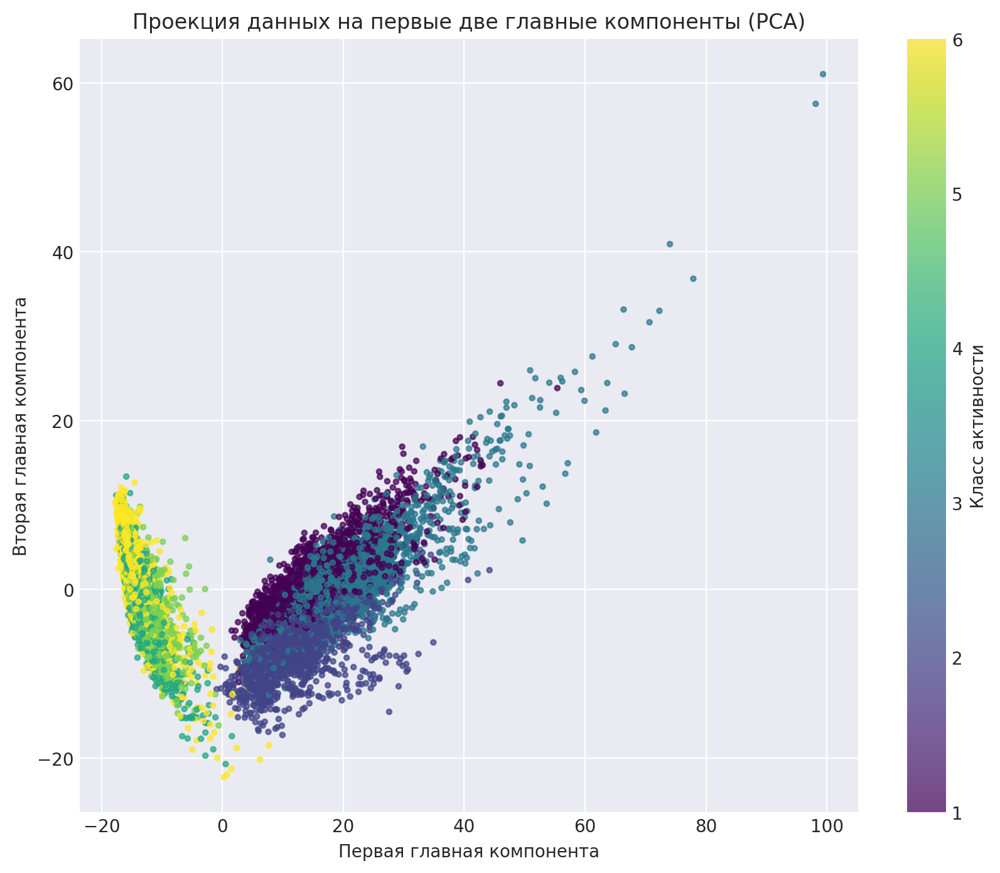

In [272]:
# Ваш код здесь
plt.figure(figsize=(10, 8))

plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    c=y,              # раскраска по классам
    cmap="viridis",
    s=8,
    alpha=0.7
)

plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Проекция данных на первые две главные компоненты (PCA)")

cbar = plt.colorbar()
cbar.set_label("Класс активности")

plt.show()


Как видно, что у нас отделены два типа активностей: статических активностей (сидение, стояние, лежание) и движения (ходьба, вверх по лестнице, вниз по лестнице). Что касается разделения внутри, то заметно пересечение классов, что указывает на близость их сенсорных характеристик. УЖе даже в двумерной проекции можно заметить такие различия, но это конечно же не идеально, ведь разделение не на все 6 типов активностей идет

### **Задание 19. (0.5 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [273]:
# Ваш код здесь
from sklearn.cluster import KMeans

start = time.time()

kmeans = KMeans(
    n_clusters=6,
    n_init=100,
    random_state=RANDOM_STATE
)

kmeans.fit(X_pca)

train_time = time.time() - start

start = time.time()
clusters = kmeans.predict(X_pca)
predict_time = time.time() - start

print("Время обучения:", round(train_time, 4), "сек")
print("Время инференса:", round(predict_time, 4), "сек")

print("Размеры кластеров:", np.bincount(clusters))

Время обучения: 1.4784 сек
Время инференса: 0.0011 сек
Размеры кластеров: [1646 1926 2632 2471 1345  279]


Маленькое время обучения и инференса показывает, что PCA помогло ускорить все! По размерам кластеров можно отметить, что последний самый маленький относительно остальных пяти: возможно, это редкая активность 

### **Задание 20 (0.2 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

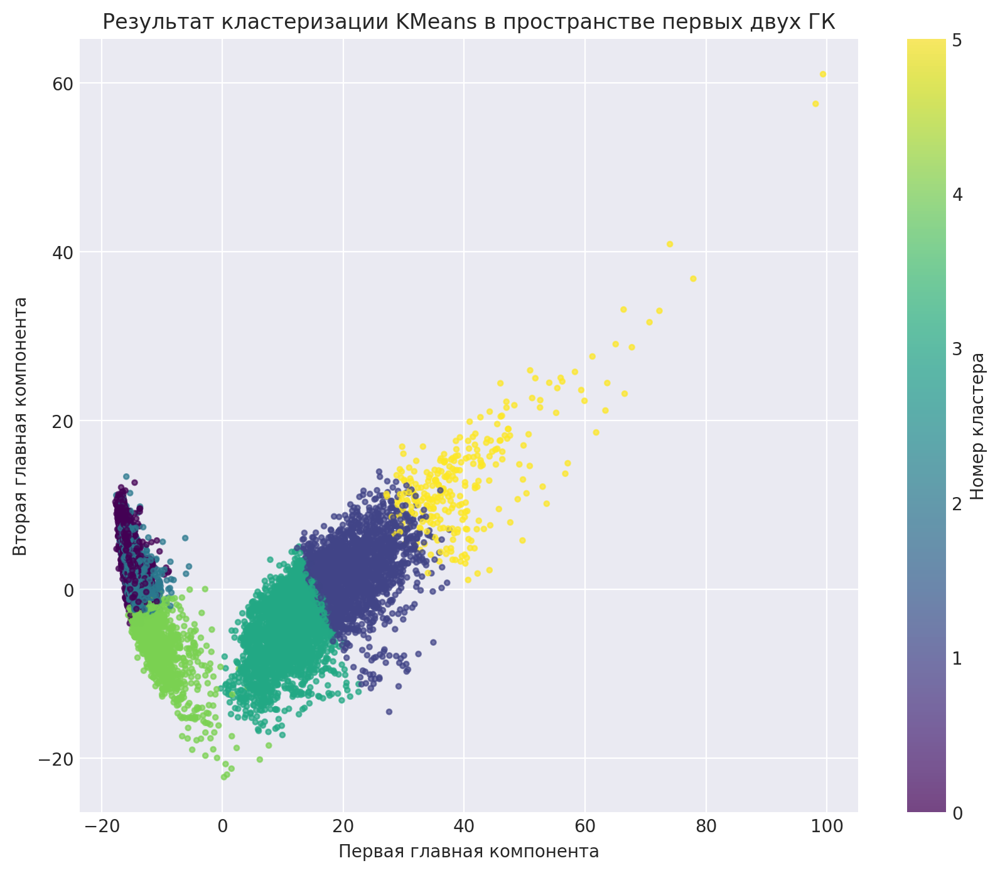

In [274]:
# Ваш код здесь
plt.figure(figsize=(10, 8))

plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    c=clusters,
    cmap="viridis",
    s=8,
    alpha=0.7
)

plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Результат кластеризации KMeans в пространстве первых двух ГК")

cbar = plt.colorbar()
cbar.set_label("Номер кластера")

plt.show()


Видно, что разделение очень хорошее - видны все 6 кластеров. Правая группа (динамическая) очень хорошо отделяется друг от друга: особенно желтый. В левой части (статической) видно, что перемешаны цвета, активности похожи - имеют схожие сенсорные сигналы

### **Задание 21 (0.3 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [275]:
# Ваш код здесь
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

#Adjusted Rand Index (ARI) измеряет совпадение двух разбиений с поправкой на случайность
# Normalized Mutual Information (NMI) измеряет информационную согласованность кластеров и истинных классов

y_1d = y.iloc[:, 0].to_numpy()

ari = adjusted_rand_score(y_1d, clusters)
nmi = normalized_mutual_info_score(y_1d, clusters)

print("ARI:", round(ari, 4))
print("NMI:", round(nmi, 4))

ARI: 0.4195
NMI: 0.56


**Ваш вывод здесь**

ARI = 0.42 означает, что разбиение проходит лучше случайного (=0), но все еще хуже идеального (=1), структура активностей частично восстановлена

NMI = 0.56 означает, что кластеры несут значимую информацию о типах активности

Разбиние может быть лучше!

### **Задание 22 (0.7 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [276]:
# Ваш код здесь
from sklearn.cluster import AgglomerativeClustering

start = time.time()

agg = AgglomerativeClustering(
    n_clusters=6,
    linkage="ward"  
)

clusters_agg = agg.fit_predict(X_pca) #тут фит сразу с предиктом идет

agg_time = time.time() - start

print("Agglomerative время (fit_predict):", round(agg_time, 4), "сек")
print("Размеры кластеров Agglomerative:", np.bincount(clusters_agg))


Agglomerative время (fit_predict): 1.614 сек
Размеры кластеров Agglomerative: [2281 3465 2241  150 1675  487]


Тут можно отметить, что тоже есть кластер с небольшим количеством наблюдений - 150, также может быть связано с тем, что это редкая активность. А также есть большой кластер 3465 - либо там правда много наблюдений, либо это объединение нескольких активностей по типам - динамические или статические

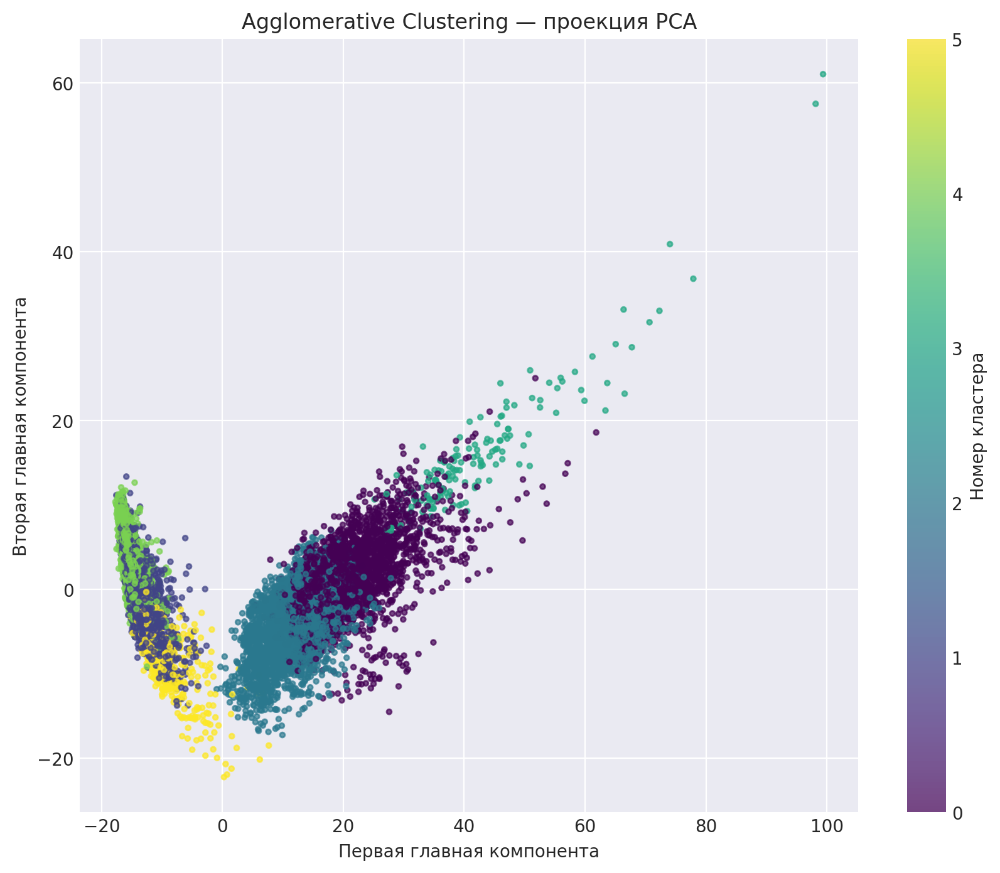

In [277]:
plt.figure(figsize=(10, 8))

plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    c=clusters_agg,
    cmap="viridis",
    s=8,
    alpha=0.7
)

plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Agglomerative Clustering — проекция PCA")

plt.colorbar(label="Номер кластера")
plt.show()


**Ваш вывод здесь**

In [278]:
y_1d = y.iloc[:, 0].to_numpy() if hasattr(y, "iloc") else y

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari_agg = adjusted_rand_score(y_1d, clusters_agg)
nmi_agg = normalized_mutual_info_score(y_1d, clusters_agg)

print("Agglomerative ARI:", round(ari_agg, 4))
print("Agglomerative NMI:", round(nmi_agg, 4))


Agglomerative ARI: 0.4936
Agglomerative NMI: 0.6218


Метрики у этой кластеризации в разы лучше чем у к-средних. По времени они примерно одинаково работают (может быть благодаря тому, что данные были сжаты при помощи PCA). График схож с k-средними, тоже видно две дуги (статитика и динамика), но можно отметить, что меньше перемешиваний в центре как у к-средних + границы визуально чище - это показал и прирост в метриках

### **Задание 23 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

**Ваш вывод здесь**

Лучшая модель по метрикам: **AgglomerativeClustering**

Похожи ли объекты внутри каждого кластера на определенный тип активности человека? 
- Да, часть кластеров достаточно однородна и соответствует конкретным типам активности, особенно статическим (сидение, стояние, лежание). Эти активности имеют стабильные сенсорные сигналы и низкую вариативность, поэтому формируют компактные и хорошо отделимые группы. Это видно и по PCA-проекции, и по наличию небольших плотных кластеров.

В каких кластерах смешано несколько типов активности? 
- Смешивание наблюдается в кластерах, связанных с динамическими активностями — ходьбой и движением по лестнице. Их сенсорные признаки и агрегированные статистики очень похожи, поэтому расстояния между объектами близки. Из-за этого алгоритм объединяет несколько видов движения в один кластер.

Качественная ли получилась кластеризация?
- Кластеризация получилась качественной для задачи без учителя: итоговые метрики ARI ≈ 0.49 и NMI ≈ 0.62 показывают заметное совпадение с истинными классами. Визуализация также демонстрирует устойчивые и интерпретируемые группы объектов. Кроме того, агломеративная модель дала лучшие метрики, чем к-средние, что подтверждает осмысленность структуры кластеров.


## **Бонус-задание (1 балл)**
![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. В бонусе предлагаем вам попрактиковаться именно в этом на чудесной утке и совах (```duck.jpg``` и ```owls.jpg```)

### **(0.1 балл)**

- Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

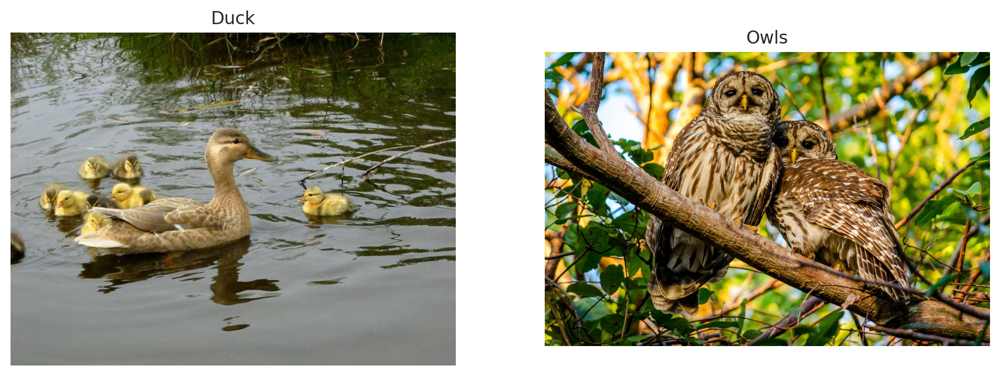

In [279]:
from PIL import Image
import matplotlib.pyplot as plt

duck = Image.open("duck.jpg")
owls = Image.open("owls.jpg")

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(duck)
plt.title("Duck")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(owls)
plt.title("Owls")
plt.axis("off")

plt.show()

### **(0.4 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :) )

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [280]:
def find_components(image, lmbd, n_clusters):
    #your code here

    img = np.array(image.convert("RGB"), dtype=np.float32) / 255.0  # (H,W,3)
    H, W, _ = img.shape

    ys, xs = np.meshgrid(np.linspace(0, 1, H), np.linspace(0, 1, W), indexing="ij")

    # формируем признаки
    X = np.column_stack([
        lmbd * xs.ravel(),
        lmbd * ys.ravel(),
        img[..., 0].ravel(),
        img[..., 1].ravel(),
        img[..., 2].ravel(),
    ])

    kmeans = KMeans(
        n_clusters=n_clusters,
        n_init=20,
        random_state=RANDOM_STATE
    )
    labels = kmeans.fit_predict(X).reshape(H, W)

    seg = np.zeros_like(img)
    for c in range(n_clusters):
        mask = labels == c
        if np.any(mask):
            seg[mask] = img[mask].mean(axis=0)

    return labels, seg

def show_segmentation(img_pil, labels, seg, title):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(img_pil)
    plt.title("Оригинал")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, cmap="viridis")
    plt.title("Метки кластеров")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(seg)
    plt.title("Сегментация (ср. цвет)")
    plt.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


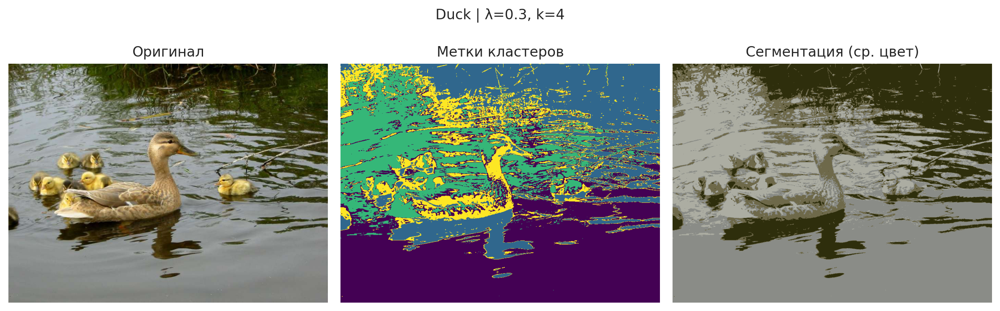

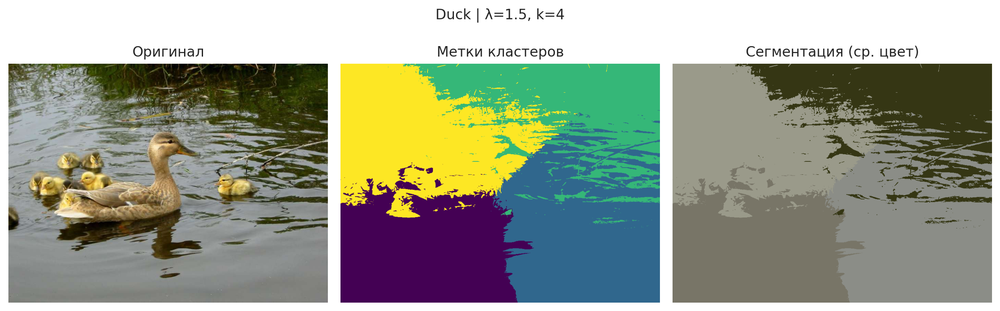

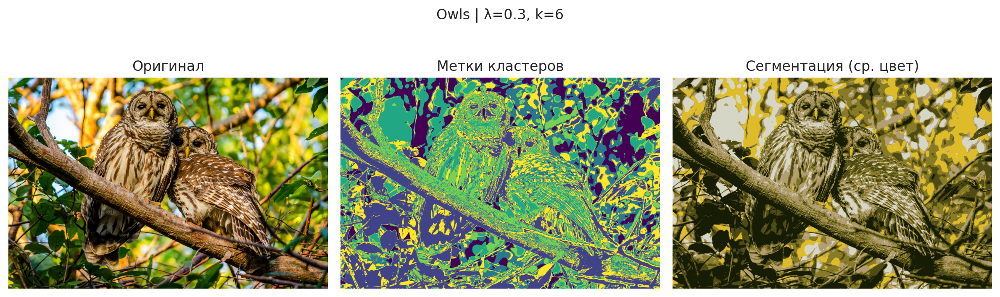

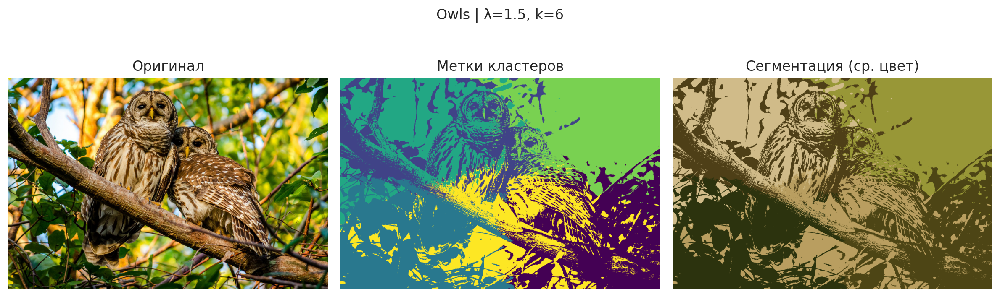

In [281]:
k_duck = 4
k_owls = 6

for lam in [0.3, 1.5]:
    labels, seg = find_components(duck, lmbd=lam, n_clusters=k_duck)
    show_segmentation(duck, labels, seg, title=f"Duck | λ={lam}, k={k_duck}")

for lam in [0.3, 1.5]:
    labels, seg = find_components(owls, lmbd=lam, n_clusters=k_owls)
    show_segmentation(owls, labels, seg, title=f"Owls | λ={lam}, k={k_owls}")


### **(0.4 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [282]:
from skimage import color, transform

def spectral_segmentation(image, n_clusters=3, scale=0.15):
    image = np.array(image)
    h, w = int(image.shape[0]*scale), int(image.shape[1]*scale)
    img_small = transform.resize(image, (h, w))
    gray = color.rgb2gray(img_small)
    grad_y, grad_x = np.gradient(gray)
    grad_mag = np.sqrt(grad_x**2 + grad_y**2)
    h_flat, w_flat = h, w
    y_coords, x_coords = np.mgrid[0:h_flat, 0:w_flat]
    features = np.stack([grad_mag.flatten(), x_coords.flatten() / w_flat, y_coords.flatten() / h_flat, gray.flatten()], axis=1)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(features)
    labels_img = labels.reshape(h_flat, w_flat).astype(float)
    segmented = color.label2rgb(labels_img, img_small, kind='avg')
    return labels_img, segmented

duck_labels, duck_seg = spectral_segmentation(duck, 3, scale=0.15)
owls_labels, owls_seg = spectral_segmentation(owls, 3, scale=0.15)

### **(0.1 балл)**
Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.

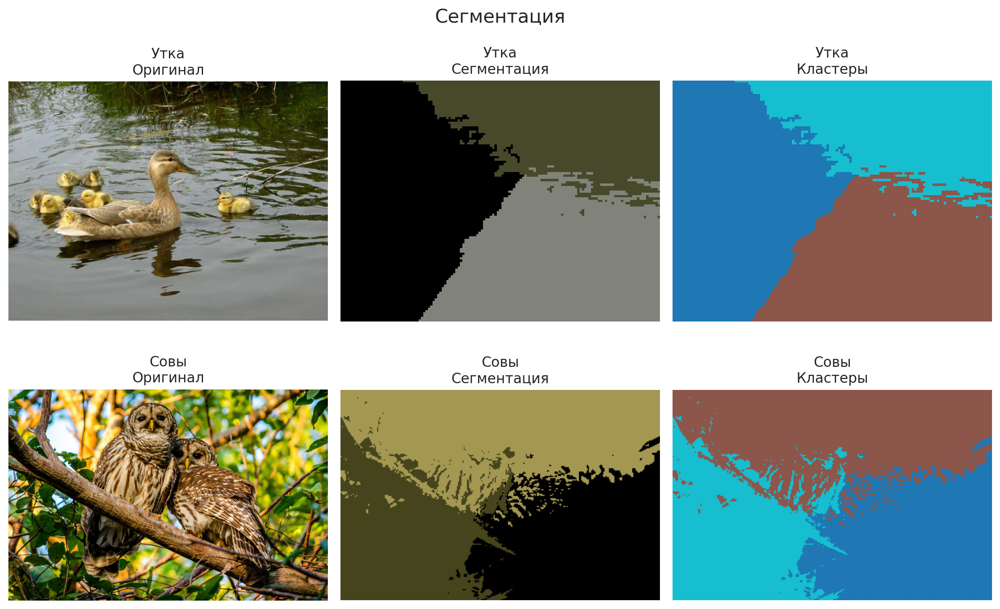

In [283]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.suptitle("Сегментация", fontsize=16)

axes[0, 0].imshow(np.array(duck)); axes[0, 0].set_title("Утка\nОригинал"); axes[0, 0].axis("off")
axes[0, 1].imshow(duck_seg);       axes[0, 1].set_title("Утка\nСегментация"); axes[0, 1].axis("off")
axes[0, 2].imshow(duck_labels, cmap="tab10"); axes[0, 2].set_title("Утка\nКластеры"); axes[0, 2].axis("off")

axes[1, 0].imshow(np.array(owls)); axes[1, 0].set_title("Совы\nОригинал"); axes[1, 0].axis("off")
axes[1, 1].imshow(owls_seg);       axes[1, 1].set_title("Совы\nСегментация"); axes[1, 1].axis("off")
axes[1, 2].imshow(owls_labels, cmap="tab10"); axes[1, 2].set_title("Совы\nКластеры"); axes[1, 2].axis("off")

plt.tight_layout()
plt.show()

**Спасибо! Вы — человек — большой трудяга!**

Успокоительный кот :)

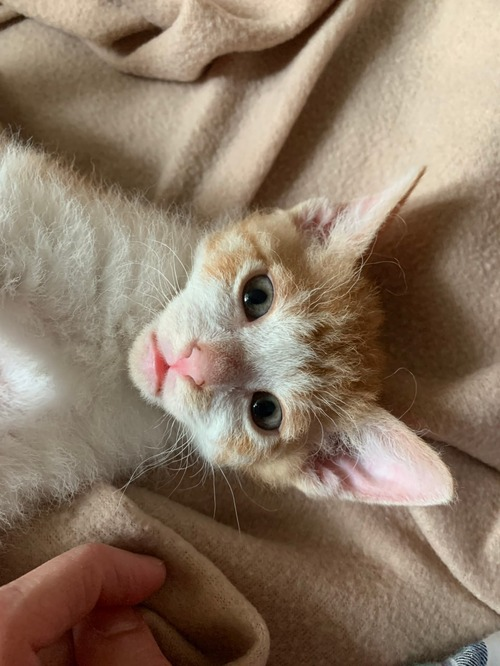